In [ ]:
#!unzip "drive/MyDrive/dog project files/dog-breed-identification.zip" -d "drive/MyDrive/dog project files"

## ✅**Image classifier project using tensorflow**
* 1) problem statement: Given a dataset of dog images which had 10222 images i had to create a   model for identifying each dog breed 🐕
* 2) Data: The data was huge so converting into batches was required so made a function to train data in batches and feed into the model📚
* 3) Evaluation: Visualizing Data batches for better understanding 🐶
* 4) Modelling: Model used is mobilenet V2 which uses CNN for classification of images 🤖
* 5) Tuning: Changing the no of epochs

By ©️ Saumik Sarkar



In [ ]:
#Start by importing tensorflow

In [ ]:
##Getting project files ready now 



1.   Importing tensorflow ✅
2.   Importing tensorflow hub ✅
3.   Importing a GPU ✅






In [ ]:

import tensorflow as tf 
import tensorflow_hub as hub 
print("hub version:", hub.__version__)
print("version:", tf.__version__)
print("GPU","available(YES)" if tf.config.list_physical_devices("GPU") else "Not available")

hub version: 0.13.0
version: 2.12.0
GPU available(YES)


In [ ]:
## turning data into tensors
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/dog project files/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


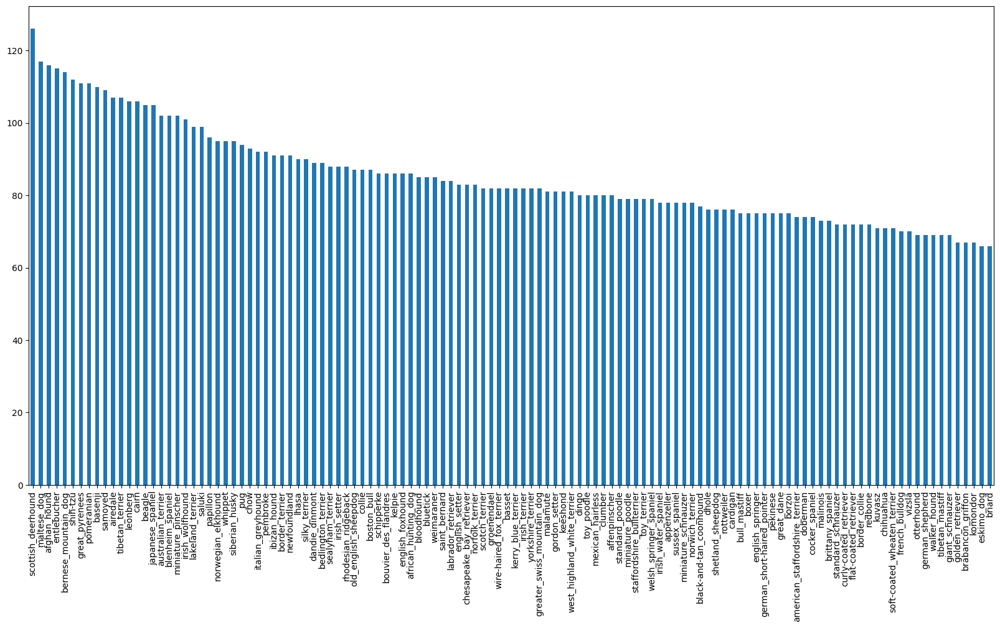

In [ ]:
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

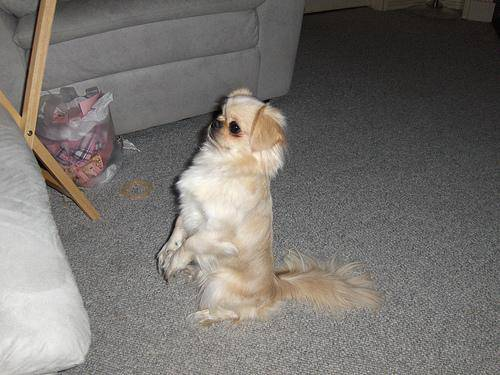

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/dog project files/train/001cdf01b096e06d78e9e5112d419397.jpg")

⚓**Creating a list of ID for all dog names**


In [ ]:
filenames=["drive/MyDrive/dog project files/train/"+fname+".jpg" for fname in labels_csv["id"]]

In [ ]:
import os
if len(os.listdir("drive/MyDrive/dog project files/train/")) == len(filenames):
  print("All the data lengths matched");
else:
  print("No match of Data")

No match of Data


In [ ]:
##creating labels
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
##finding the unique label values
unique_labels=np.unique(labels);
len(unique_labels)


120

In [ ]:
##turning the labels into array
boolean_label=[labels==unique_labels for labels in labels]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

#Creating a validation Set ☁

In [ ]:
print(len(boolean_label))
X=filenames
Y=boolean_label

10222


In [ ]:
## Training the model with less data and the increasing the data
## so create a slider
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10000,step:1000}

Splitting data into training and validation set:

In [ ]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
X_train,X_test,Y_train,Y_test=train_test_split(X[:NUM_IMAGES],
                                                 Y[:NUM_IMAGES],
                                               test_size=0.2,random_state=42)
len(X_train),len(X_test),len(Y_train),len(Y_test)

(800, 200, 800, 200)

##Image to tensors

In [ ]:
#convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[40])
image.shape


(293, 400, 3)

In [ ]:
#as i have converted the images to tensors now we can feed it into the machine learning model
tf.constant(image)

<tf.Tensor: shape=(293, 400, 3), dtype=uint8, numpy=
array([[[255, 246, 252],
        [254, 237, 243],
        [253, 237, 240],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 251, 249],
        [255, 246, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 141,  72]],

       [[238, 236, 221],
        [244, 245, 229],
        [231, 232, 214],
        ...,
        [ 87, 137,  64],
        [ 85, 135,  64],
        [ 95, 146,  77]],

       ...,

       [[125, 142,  72],
        [118, 136,  84],
        [122, 145, 103],
        ...,
        [124, 142, 102],
        [142, 162, 125],
        [179, 201, 165]],

       [[113, 130,  60],
        [111, 129,  77],
        [119, 142, 100],
        ...,
        [122, 140, 100],
        [136, 156, 119],
        [170, 192, 156]],

       [[106, 123,  52],
        [104, 122,  70],
        [113, 136,  92],
        ...,
        [122, 140, 10

###Make a function to preprocess all the **images**: 


In [ ]:
IMG_SIZE=224
##a function to preprocess images for feeding it into model
def process(image_path):
  #Reading and image file
  image=tf.io.read_file(image_path)
  #making color channels
  image=tf.image.decode_jpeg(image,channels=3)
  #scale data into numbers between 0,1 makes the predictions more efficent and improves cross val score
  image=tf.image.convert_image_dtype(image,tf.float32)
  ## resize image for perfect square 
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image


In [ ]:
#turning data into batches
##processing all images at once may take overflow of GPU
#we need to create a tuple to feed into the machine learning model in the form of (image,label)
def get_image_label(image_path,label):
  image=process(image_path)
  return image,label;


In [ ]:
(process(X[42]),Y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
##Function to turn data into batches
BATCH_SIZE=32;
def create_data_batches(X,Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  #test data sets have no labels
  if test_data:
    print("Creating test data batches");
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process).batch(BATCH_SIZE)
    return data_batch
  ##validation data set has labels
  elif valid_data:
    print("Creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    ##test data has also to be shuffled
    print("Creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    ##shuffling pathnames and labels before matching into bathces
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    ##finally turning the data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch 

In [ ]:
train_data=create_data_batches(X_train,Y_train)
valid_data=create_data_batches(X_test,Y_test,valid_data=True)

Creating training data batches
Creating validation data batches


##Visualizing Data Batches 🐶


In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  #Display 25 images plot at a time
  plt.figure(figsize=(10,10))
  for i in range(25):
    #Creating subplot (5rows,5 colums)
    ax=plt.subplot(5,5,i+1)
    #displaying the imaeg now
    plt.imshow(images[i])
    #image label will be the breed name
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")

In [ ]:
unique_labels[:5]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier'], dtype=object)

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

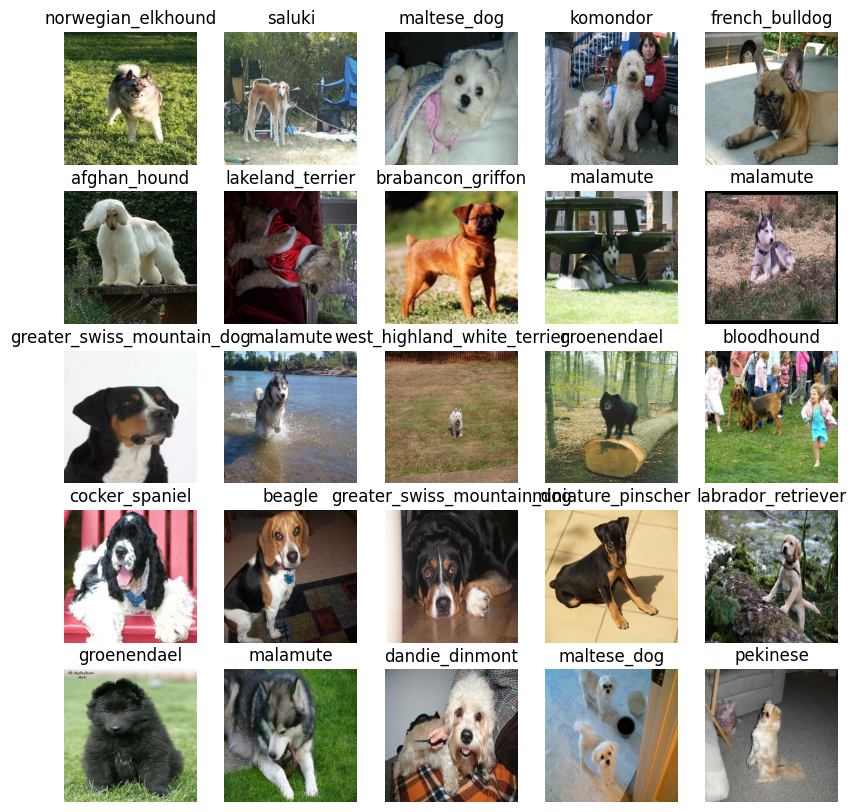

In [ ]:
show_25_images(train_images,train_labels)

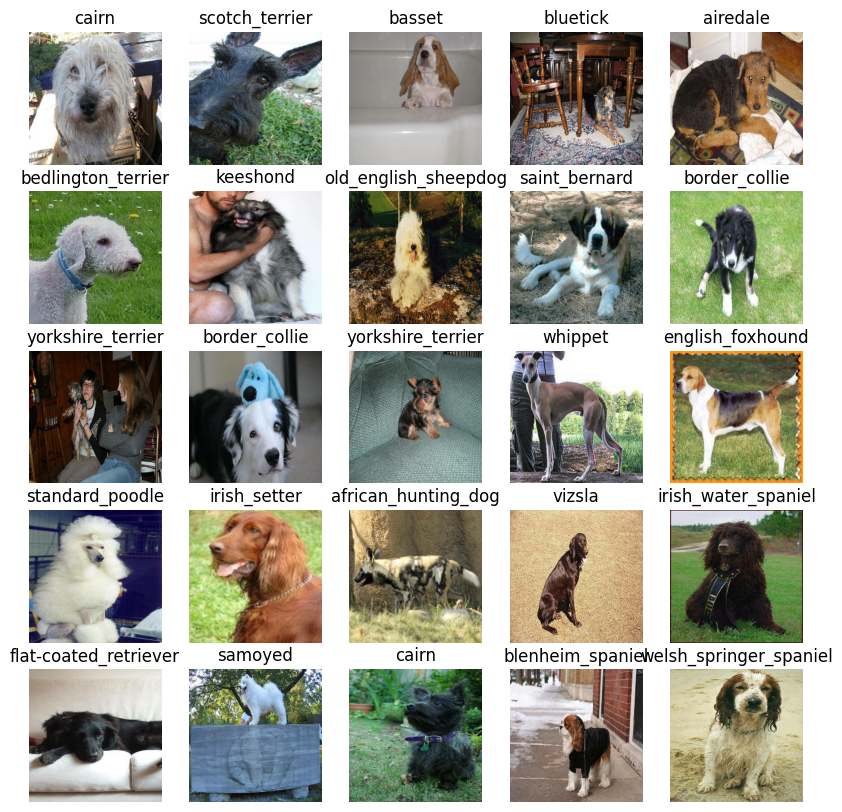

In [ ]:
val_images,val_labels=next(valid_data.as_numpy_iterator())
show_25_images(val_images,val_labels)


## ✅**Modelling** 🐶
Model taken from tfhub = https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3] #format is [batch,height,width,color channels] //input image shape
OUTPUT_SHAPE=len(unique_labels) #Output image shape
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
len(unique_labels)

120

Keras deep learning model (Sequential) info in - https://www.tensorflow.org/guide/keras/sequential_model 

In [ ]:
#Using keras deep learning model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Model:" ,MODEL_URL)
  model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), #layer1(Input)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") #Layer2(OUTPUT) //we will scale the output to all unique labels because we don't need 1280 outputs by onvolution
   ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(), #function to optimize paths to reach target
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model=create_model()
model.summary()

Model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


####Callback Function ( Helper to track training progress and stop from overfitting and stop model from training too long): ✅

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/dog project files/logs",datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir) 

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)#this is for preventing overfitting model
 #if the model takes too much time t train

In [ ]:
##training model
EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}


In [ ]:
##function to create and train the model with every batch of epoch or data
def train_model():
  model=create_model() #calling the create model created above
  tensorboard=create_tensorboard_callback() #everytime batch trained store it in the logs
  ##fiting the data into the model
  model.fit(x=train_data,epochs=EPOCHS,validation_data=valid_data,validation_freq=1,callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model=train_model()

Model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 164s 6s/step - loss: 4.5881 - accuracy: 0.1013 - val_loss: 3.3941 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 3s 133ms/step - loss: 1.6350 - accuracy: 0.6750 - val_loss: 2.1672 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 5s 196ms/step - loss: 0.5794 - accuracy: 0.9325 - val_loss: 1.7037 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2545 - accuracy: 0.9875 - val_loss: 1.5108 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 145ms/step - loss: 0.1463 - accuracy: 0.9975 - val_loss: 1.4303 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 149ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3912 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 4s 143ms/st

In [ ]:
## From above the train Data accuraccy is 1.000 or 100% whereas valid_data accuracy is just 65% means the model is overfitting

####USING TensorBoard to evaluate log files

In [75]:
%tensorboard --logdir "/content/drive/MyDrive/dog project files/logs/26052023-174722"

Reusing TensorBoard on port 6006 (pid 10350), started 1:03:37 ago. (Use '!kill 10350' to kill it.)

<IPython.core.display.Javascript object>

*Making predictions using validation data* 🐶 


In [ ]:
predictions=model.predict(valid_data,verbose=1)
predictions 


In [ ]:
predictions.shape #200 arrays of 120 different numbers 
len(unique_labels) ## this means our dog data had 120 unique label and every image has a 200 array matrix of probabilites of patterns of images

In [ ]:
index=0 
print(predictions[index])
print(f"Max value of prediction: {np.max(predictions[index])}") ##max value of pattern found
print(f"Sum:{np.sum(predictions[index])}") #softmax sum which will result to 1
print(f"Max index:{np.argmax(predictions[index])}") # max index of the prediction label that identifies a dog
print(f"Predicted Label:{unique_labels[np.argmax(predictions[index])]}") # predicted label



### Predicted label to its image for actual visualisation and comparison with its truth label  ✅

In [ ]:
##transform predictions probabilities into labels
def get_pred_label(pred_probabilities):
  return unique_labels[np.argmax(pred_probabilities)]
pred_label=get_pred_label(predictions[0])
pred_label

In [ ]:
valid_data


### After we have our predicited labels it is important to now compare them with the valid data
##### for that first unbatch teh valid data and the compare it with predicted labels

In [ ]:
##function to unbatch the data
##using unbatch().as_numpy_iterator() fcn
def unbatchify(data):
  ## this fucntion will take the batch dataset from validation data and return images and labels into seperated lists
  images=[] # sepeeated all values of validtion images into this list
  labels=[] # seperated all values of validation iamges into this list 
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images, labels

val_images,val_labels=unbatchify(valid_data);
val_images[0],val_labels[0]


The things that are complete ✅

1.   prediction labels
2.   validation labels 
3.   validation images 

Making a function where: 🤖


*   Takes an array of prediction probabilites and array of truth labels
*   plots the predicted label,its predicted probability and the truth value 





In [ ]:
def plot_pred(pred_probabilities,labels,images,n=1):
  pred_prob,true_label,image=pred_probabilities[n],labels[n],images[n]
  ##pred label
  pred_label=get_pred_label(pred_prob)
  #plotting 
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if(pred_label==true_label):
    color="green"
  else:
    color="red"
  plt.title("Predicted:{} Accuracy:{:2.0f}% True:{}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

In [ ]:
plot_pred(pred_probabilities=predictions,labels=val_labels,images=val_images,n=45)


**Note** : The above image label is green that means the model has correctly predicted the true label and predicted label ✅

##### Defining a function to check maximum dependency of probability values for turning the label green or correct value


In [72]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  #getting the predicted label
  pred_label=get_pred_label(pred_prob)
  #top 10 prediciton confidence index
  top_10_pred=pred_prob.argsort()[-10:][::-1]
  #top 10 prediciton confidence values
  top_10_values=pred_prob[top_10_pred]
  #top 10 prediction labels
  top_10_labels=unique_labels[top_10_pred]

  top_plot=plt.bar(np.arange(len(top_10_labels)),top_10_values,color='grey')

  plt.xticks(np.arange(len(top_10_labels)),labels=top_10_labels,rotation="vertical")

  ##if the truth label is present in the top 10 predicted 
  if np.isin(true_label,top_10_labels):
    top_plot[np.argmax(top_10_labels==true_label)].set_color("green")
  else:
    pass

In [71]:
unique_labels[predictions[0].argsort()[-10:][::-1]] ##SO for image in 0th index these are the top 10 predicted labels

array(['border_terrier', 'irish_wolfhound', 'soft-coated_wheaten_terrier',
       'cairn', 'lhasa', 'maltese_dog', 'komondor', 'silky_terrier',
       'standard_schnauzer', 'lakeland_terrier'], dtype=object)

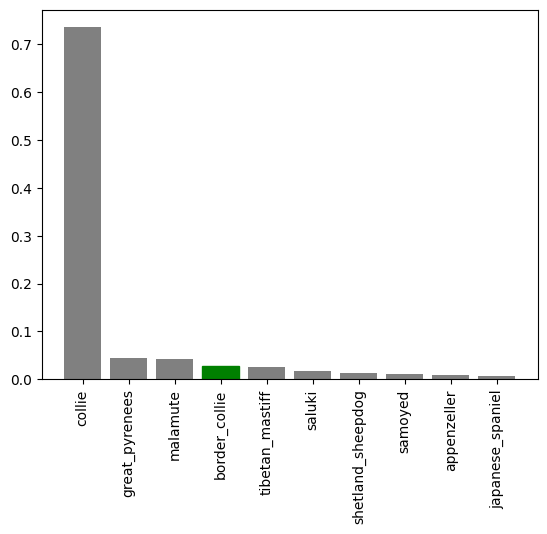

In [70]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

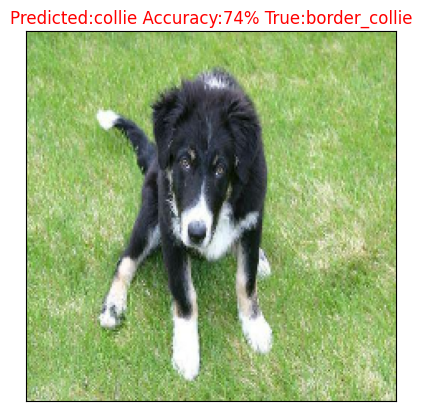

In [74]:
plot_pred(pred_probabilities=predictions,labels=val_labels,images=val_images,n=9) 
#SO the predicted was collie from the graph which doesn't match the truth label hence this wrong predicition

Complete!!! 🐕

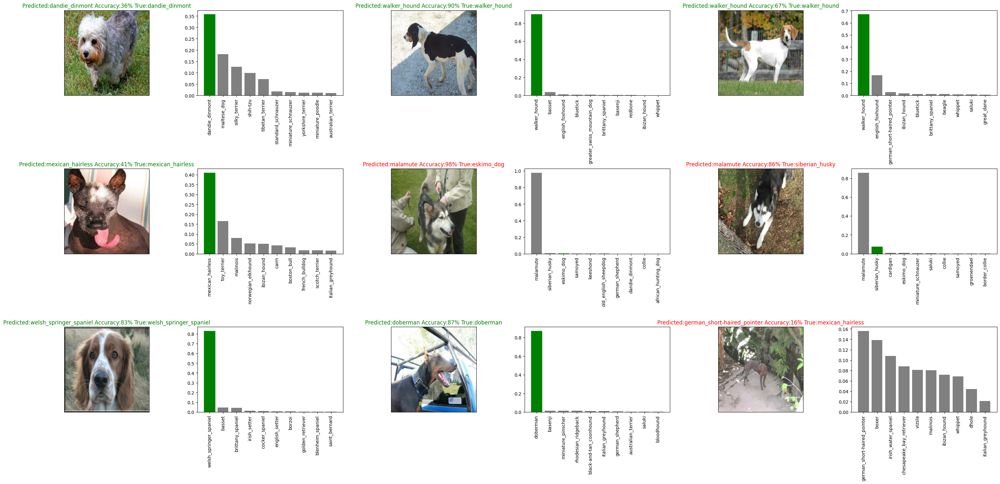

In [79]:
#plotting different subplots
i_multiplier = 30 # constant index of images 
num_rows = 3
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pred_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Done!! So saving the model now for not to be retrained again**

In [ ]:
# from sklearn import metrics
# confusion_matrix = metrics.confusion_matrix(val_labels, predictions) 
def save_model(model, suffix=None):

  # Creates model directory with current time
  modeldir = os.path.join("drive/My Drive/dog project files/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
##Function to load the saved model
def load_model(model_path):
  print(f"Loading Saved model:{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer}) 
  #custom objects will automatically import keras layers along with the model when loaded
  return model 

In [ ]:
save_model(model,suffix="trained_model_1000")

Saving model to: drive/My Drive/dog project files/models/20230604-05401685857230-trained_model_1000.h5...


'drive/My Drive/dog project files/models/20230604-05401685857230-trained_model_1000.h5'

In [76]:
loading_1000_image_model=load_model('drive/My Drive/dog project files/models/20230530-10051685441119-trained_model_1000.h5')

Loading Saved model:drive/My Drive/dog project files/models/20230530-10051685441119-trained_model_1000.h5


In [77]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2798 - accuracy: 0.6850


[1.279758095741272, 0.6850000023841858]

In [78]:
loading_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 3s 182ms/step - loss: 1.2484 - accuracy: 0.6900


[1.248377799987793, 0.6899999976158142]